# DengAI Analysis Part 3 - Linear Regression Assumptions (OPTIONAL)

By: Chengyi (Jeff) Chen, under guidance of CSCI499: AI for Social Good Teaching Assistant - Aaron Ferber

---
## Content

In this notebook, we will look at whether our Linear Regression assumptions hold in order to effectively use a linear model for our predictions.

<a id="imports"></a>

---
## Library Imports

In [1]:
# Library Imports
import pandas as pd
import numpy as np
import subprocess
import statsmodels.formula.api as sm
from statsmodels import stats as sms
import statsmodels as statsmodels
from scipy import stats
import os
from collections import Counter
from sklearn import model_selection, kernel_ridge, linear_model, metrics, feature_selection, preprocessing
from os import listdir
from os.path import isfile, join, isdir
import warnings
warnings.filterwarnings('ignore')

# plotting libraries
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn-paper')
import seaborn as sns
sns.set(style="ticks")
from pylab import rcParams
%matplotlib inline

In [2]:
# DengAI dataset URLs
dengai_features_url = 'https://www.dropbox.com/s/1kuf94b4mk6axyy/dengue_features_train.csv'
dengai_labels_url = 'https://www.dropbox.com/s/626ak8397abonv4/dengue_labels_train.csv'
dengai_test_features_url = 'https://s3.amazonaws.com:443/drivendata/data/44/public/dengue_features_test.csv'

In [3]:
# Helper function to create a new folder
def mkdir(path):
    try: 
        os.makedirs(path)
    except OSError:
        if not os.path.isdir(path):
            raise
        else:
            print("(%s) already exists" % (path))

<a id="clean_feats"></a>

---
## Cleaned Features

In [4]:
sj_X = pd.read_csv('./data/dengai/cleaned/sj_X.csv', index_col='week_start_date')
sj_y = pd.read_csv('./data/dengai/cleaned/sj_y.csv', header=None, names=['week_start_date', 'num_cases'], index_col='week_start_date')
iq_X = pd.read_csv('./data/dengai/cleaned/iq_X.csv', index_col='week_start_date')
iq_y = pd.read_csv('./data/dengai/cleaned/iq_y.csv', header=None, names=['week_start_date', 'num_cases'], index_col='week_start_date')

<a id="power_transform"></a>

---
## Yeo-Johnson Transform the Labels

In [5]:
from sklearn.preprocessing import PowerTransformer

# Applying yeo-johnson transform on the labels of City sj 
# REMEMBER TO INVERSE TRANSFORM YOUR Y_PREDS
sj_pwr = PowerTransformer()
sj_y = pd.Series(sj_pwr.fit_transform(sj_y).flatten(), index=sj_y.index)

# Applying yeo-johnson transform on the labels of City iq 
# REMEMBER TO INVERSE TRANSFORM YOUR Y_PREDS
iq_pwr = PowerTransformer()
iq_y = pd.Series(iq_pwr.fit_transform(iq_y).flatten(), index=iq_y.index)

In [6]:
from sklearn.model_selection import train_test_split

# Split our train and test data
sj_X_train, sj_X_test, sj_y_train, sj_y_test = train_test_split(sj_X, sj_y, test_size=0.33, random_state=42)
iq_X_train, iq_X_test, iq_y_train, iq_y_test = train_test_split(iq_X, iq_y, test_size=0.33, random_state=42)

<a id="linregassumptions"></a>

---
## Linear Regression Model Assumptions

__*According to the Gauss-Markov theorem, the Ordinary Least Squares method in Classical Linear Regression gives the best estimator of best fit, but has quite a number of assumptions, let's address them first to see if it is still an appropriate model and what we can do to make it appropriate*__

We have:
1. The model parameters are linear, meaning the regression coefficients don’t enter the function being estimated as exponents (although the variables can have exponents).

2. The values for the independent variables are derived from a random sample of the population, and they contain variability.

3. The explanatory variables don’t have perfect collinearity (that is, no independent variable can be expressed as a linear function of any other independent variables).

4. The error term has zero conditional mean, meaning that the average error is zero at any specific value of the independent variable(s).

5. The model has no heteroskedasticity (meaning the variance of the error is the same regardless of the independent variable’s value).

6. The model has no autocorrelation (the error term doesn’t exhibit a systematic relationship over time).

__In our analysis, we will address the following key assumptions:__
- [Linearity between the Exogenous and Endogenous variables](#linearity)
- [Normality of Features {Optional}](#normfeat)
- [Lack of Multicollinearity](#multicol)
- [Homoscedasticity](#homo)
- [Normality of Errors](#normerr)
- [Autocorrelation](#autocorr)

---
<a id="linearity"></a>

## 1. Linearity between each of the Independent Variables and the Dependent Variable

- Plotting the Dependent Variable against each of the Indepent Variables

In [7]:
# Helper function to plot scatter plots of 
# independent vars against dependent var
def plot_scatter_feats(X, y):
    rcParams['figure.figsize'] = 10, 40
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            ax[idx, 0].scatter(X[name], y, alpha=0.5, linewidths=0.01)
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Number of Cases against {}".format(name), color='k')
            ax[idx, 0].set_ylabel("Frequency")
            ax[idx, 0].set_xlabel("{}".format(name))
        else:
            ax[idx - (len(X.columns) // 2), 1].scatter(X[name], y, alpha=0.5, linewidths=0.01)
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Number of Cases against {}".format(name), color='k')
            ax[idx - (len(X.columns) // 2), 1].set_ylabel("Frequency")
            ax[idx - (len(X.columns) // 2), 1].set_xlabel("{}".format(name))

    plt.tight_layout()
    plt.show();

#### City sj:
- __Let's plot the dependent var (Number of Dengue Cases) against each of the independent vars (features)__

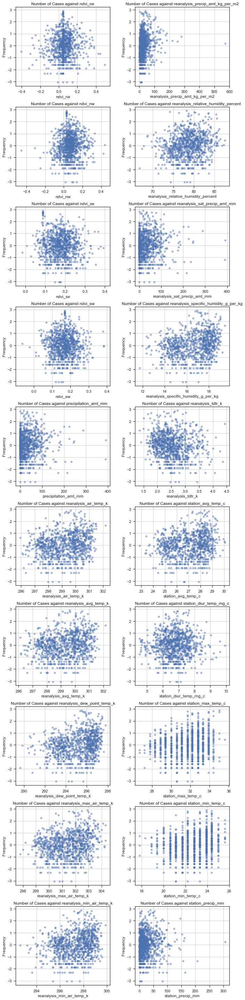

In [8]:
plot_scatter_feats(sj_X, sj_y)

#### City iq:
- __Let's plot the dependent var (Number of Dengue Cases) against each of the independent vars (features)__

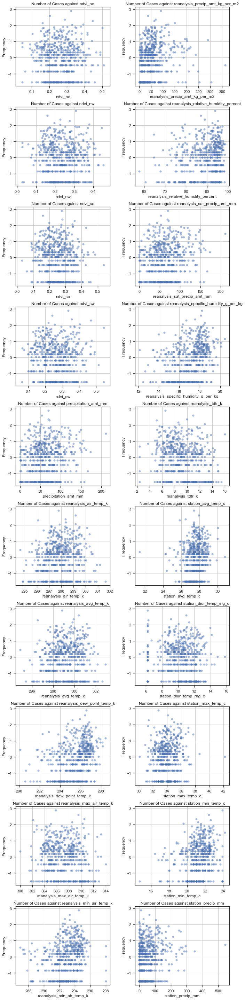

In [9]:
plot_scatter_feats(iq_X, iq_y)

#### Conclusion:

- __Seems like none of the features have a linear relationship with the number of dengue cases, so the first assumption for the use of Linear Regression doesn't hold__

---
<a id="normfeat"></a>

## 2. Normality of features

- Even though this isn't a requirement for linear regression models, it'll be a good check because we can use transformations like Yeo-Johnson (positive and negative values) / Box-Cox (Only positive values) / Log Transforms to normalize and reduce skewness of our features to tackle the problem of covariate shifting.

In [10]:
# Helper function to plot the kernel density 
# estimation plot of normal distribution overlayed
# on the distribution plot of the features
def plot_dist(X):
    rcParams['figure.figsize'] = 10, 40
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            dist_plot = sns.distplot(X[name], ax=ax[idx, 0], label=name)
            normal_dist = sns.kdeplot(np.random.normal(size=len(X[name])), ax=ax[idx, 0], label='Normal Distribution')
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Distribution of {}".format(name), color='k')
        else:
            dist_plot = sns.distplot(X[name], ax=ax[idx - (len(X.columns) // 2), 1], label=name)
            normal_dist = sns.kdeplot(np.random.normal(size=len(X[name])), ax=ax[idx - (len(X.columns) // 2), 1], label='Normal Distribution')
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Distribution of {}".format(name), color='k')

    plt.tight_layout()
    plt.show();

# Helper function to calculate the empirical cumulative 
# distribution function
def ecdf(x):
    xs = np.sort(x)
    ys = np.arange(1, len(xs) + 1) / float(len(xs))
    return xs, ys

# Helper function to plot the normal cdf overlayed on the
# empirical cdf of the feature
def plot_ecdf(X):
    rcParams['figure.figsize'] = 10, 40
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            normal_cdf_line = ax[idx, 0].scatter(X[name], stats.norm.cdf(X[name]), label='Normal CDF')
            ecdf_line = ax[idx, 0].plot(*ecdf(X[name]), label='ECDF')
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Distribution of {}".format(name), color='k')
        else:
            normal_cdf_line = ax[idx - (len(X.columns) // 2), 1].scatter(X[name], stats.norm.cdf(X[name]), label='Normal CDF')
            ecdf_line = ax[idx - (len(X.columns) // 2), 1].plot(*ecdf(X[name]), label='ECDF')
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Distribution of {}".format(name), color='k')

    plt.tight_layout()
    plt.show();

#### City sj: 
- __Let's plot the distribution of each of these independent vars (features) overlayed on a normal distribution too to see which of the features most similarly follow a normal distribution__

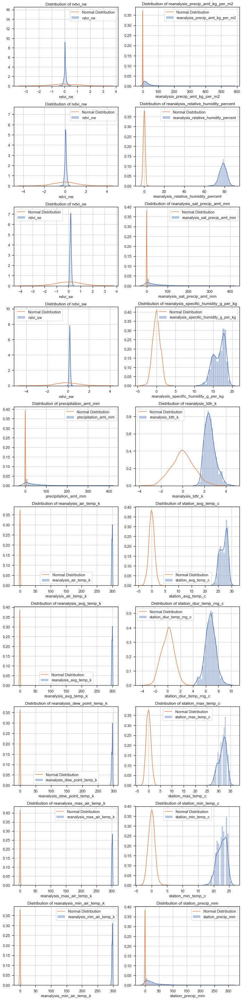

In [11]:
plot_dist(sj_X)

__Also, because we have more than 50 samples, we shall use the one-sample Kolmogorov-Smirnov Test for Normality instead of the Shapiro-Wilk Test for Normality__
- __Null Hypothesis: Sample is drawn from the Normal Distribution__

In [12]:
# Kolmogorov-Smirnov Test from scipy stats
sj_X_kstest = {}
for idx, name in enumerate(sj_X.columns):
    sj_X_kstest[name] = stats.kstest(sj_X[name], 'norm').pvalue
    print(name + ' p-value: ' + str(sj_X_kstest[name]))

ndvi_ne p-value: 6.444165324190709e-147
ndvi_nw p-value: 8.018407981845908e-162
ndvi_se p-value: 3.290057114065992e-229
ndvi_sw p-value: 6.5814645663652e-225
precipitation_amt_mm p-value: 0.0
reanalysis_air_temp_k p-value: 0.0
reanalysis_avg_temp_k p-value: 0.0
reanalysis_dew_point_temp_k p-value: 0.0
reanalysis_max_air_temp_k p-value: 0.0
reanalysis_min_air_temp_k p-value: 0.0
reanalysis_precip_amt_kg_per_m2 p-value: 0.0
reanalysis_relative_humidity_percent p-value: 0.0
reanalysis_sat_precip_amt_mm p-value: 0.0
reanalysis_specific_humidity_g_per_kg p-value: 0.0
reanalysis_tdtr_k p-value: 0.0
station_avg_temp_c p-value: 0.0
station_diur_temp_rng_c p-value: 0.0
station_max_temp_c p-value: 0.0
station_min_temp_c p-value: 0.0
station_precip_mm p-value: 0.0


__Plotting the ecdf of the feature and the normal distribution cdf__

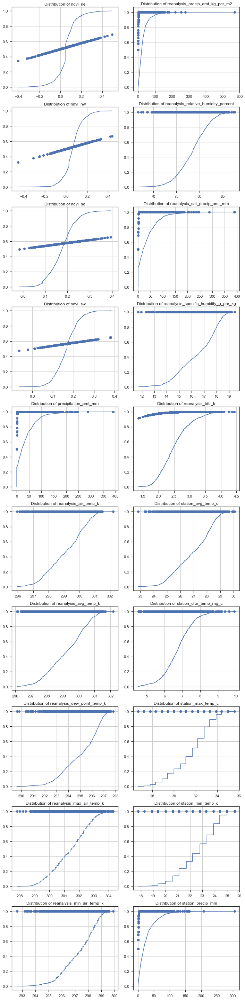

In [13]:
plot_ecdf(sj_X)

#### City iq: 
- __Let's plot the distribution of each of these independent vars (features) overlayed on a normal distribution too to see which of the features most similarly follow a normal distribution__

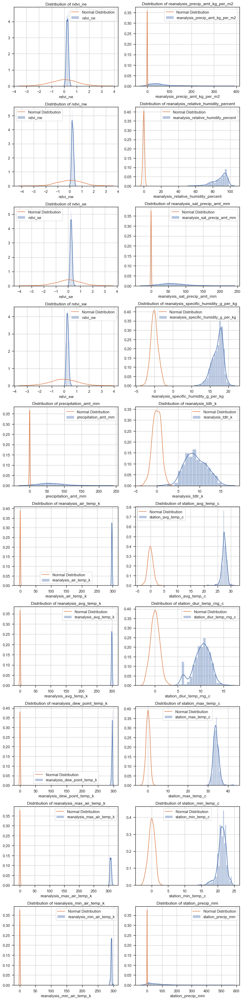

In [14]:
plot_dist(iq_X)

__Again, because we have more than 50 samples, we shall use the one-sample Kolmogorov-Smirnov Test for Normality instead of the Shapiro-Wilk Test for Normality__
- __Null Hypothesis: Sample is drawn from the Normal Distribution__

In [15]:
# Kolmogorov-Smirnov Test from scipy stats
iq_X_kstest = {}
for idx, name in enumerate(iq_X.columns):
    iq_X_kstest[name] = stats.kstest(iq_X[name], 'norm').pvalue
    print(name + ' p-value: ' + str(iq_X_kstest[name]))

ndvi_ne p-value: 1.391204576455867e-135
ndvi_nw p-value: 4.935150098784429e-131
ndvi_se p-value: 4.800097394750673e-137
ndvi_sw p-value: 1.397598704162834e-138
precipitation_amt_mm p-value: 0.0
reanalysis_air_temp_k p-value: 0.0
reanalysis_avg_temp_k p-value: 0.0
reanalysis_dew_point_temp_k p-value: 0.0
reanalysis_max_air_temp_k p-value: 0.0
reanalysis_min_air_temp_k p-value: 0.0
reanalysis_precip_amt_kg_per_m2 p-value: 0.0
reanalysis_relative_humidity_percent p-value: 0.0
reanalysis_sat_precip_amt_mm p-value: 0.0
reanalysis_specific_humidity_g_per_kg p-value: 0.0
reanalysis_tdtr_k p-value: 0.0
station_avg_temp_c p-value: 0.0
station_diur_temp_rng_c p-value: 0.0
station_max_temp_c p-value: 0.0
station_min_temp_c p-value: 0.0
station_precip_mm p-value: 0.0


__Plotting the ecdf of the feature and the normal distribution cdf__

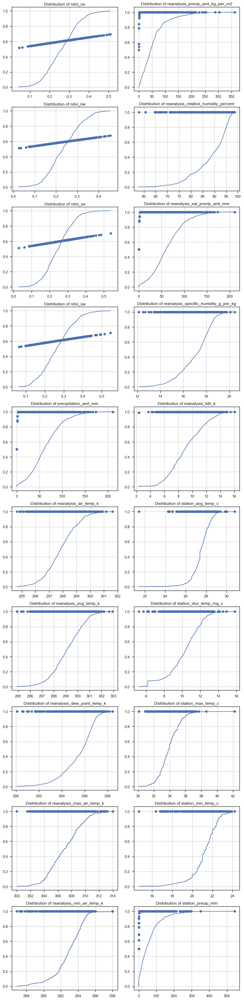

In [16]:
plot_ecdf(iq_X)

#### Conclusion:

- __Seems like none of our features are normally distributed, we would have to perform some transforms later on in the Feature Engineering section in order to improve the performances of our models__

---
<a id="multicol"></a>

## 3. Lack of Multicollinearity

In [17]:
# Helper function that plots a correlation matrix for 
# each pair of independent vars to ensure
# that no 2 features are too highly 
# correlated with each other
def correlation_matrix(X):
    axs = pd.plotting.scatter_matrix(X, figsize=(30, 30), diagonal='kde')
    n = len(X.columns)
    for x in range(n):
        for y in range(n):
            # to get the axis of subplots
            ax = axs[x, y]
            # to make x axis name vertical  
            ax.xaxis.label.set_rotation(90)
            # to make y axis name horizontal 
            ax.yaxis.label.set_rotation(0)
            # to make sure y axis names are outside the plot area
            ax.yaxis.labelpad = 50
    plt.show();

# We will use the variance inflation factor
# metric to determine which columns to drop
# Anything with VIF above 5.0 will be dropped
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Helper function to iteratively drop columns
# that have VIFs > 5.0
def calculate_vif(X, thresh=5.0):
    
        # Columns to be dropped
        dropped_cols = []
    
        # Taken from https://stats.stackexchange.com/a/253620/53565 and modified
        dropped=True
        while dropped:
            variables = X.columns
            dropped = False
            vif = [variance_inflation_factor(np.array(X), X.columns.get_loc(var)) for var in X.columns]
            
            # Get the highest VIF value
            max_vif = max(vif)
            
            # Drop the column with highest VIF value
            if max_vif > thresh:
                maxloc = vif.index(max_vif)
                dropped_cols.append(X.columns[maxloc])
                print(f'Dropping {X.columns[maxloc]} with vif={max_vif}')
                X = X.drop([X.columns.tolist()[maxloc]], axis=1)
                dropped=True
                
        return pd.DataFrame(X, index=X.index, columns=X.columns), dropped_cols

#### City sj: 
- __Multicollinearity checks__

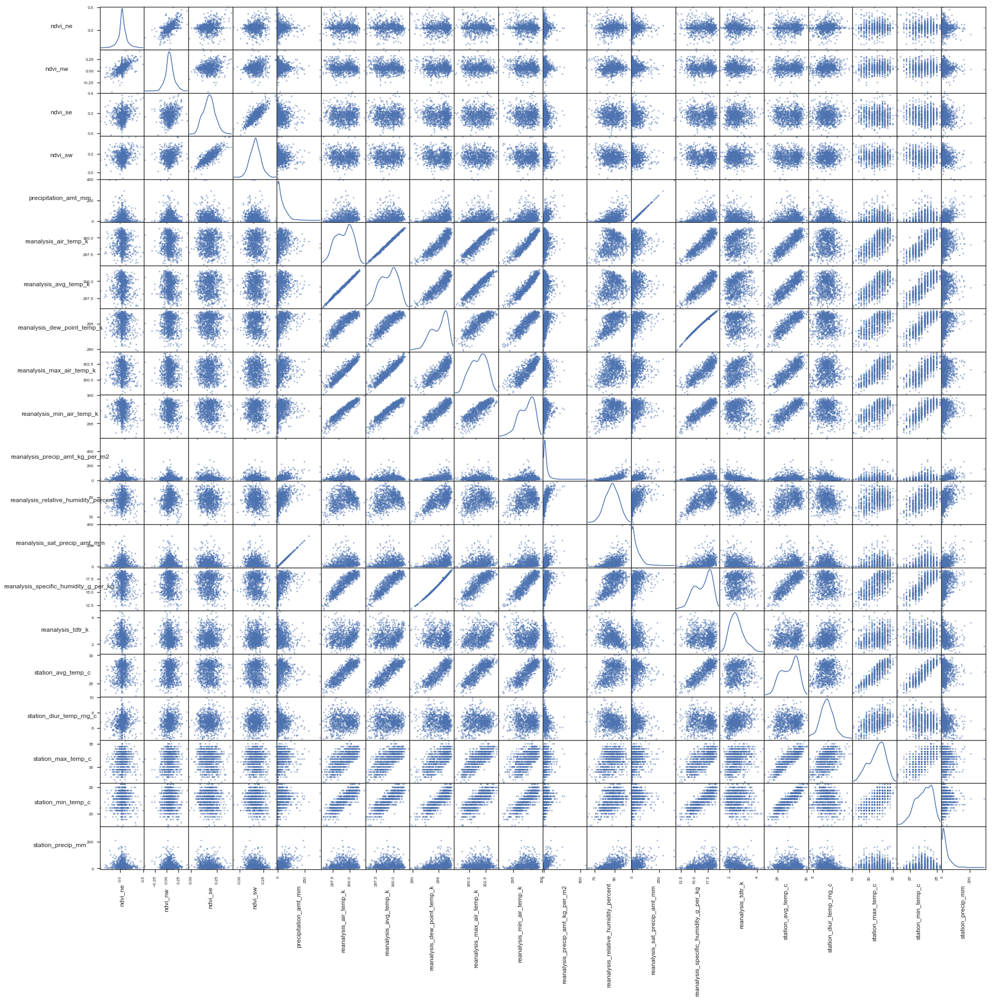

In [18]:
correlation_matrix(sj_X)

__There are definitely a number of features that are highly correlated and so we need to remove those for Linear Regression, let's take a look at the correlation matrix for City sj's data__

In [19]:
# Correlation matrix for City sj's data
sj_X.corr()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
ndvi_ne,1.000000,0.611061,0.204144,0.160510,-0.039551,-0.063952,-0.062322,-0.034695,-0.037749,-0.084744,0.005093,0.035057,-0.039551,-0.031195,-0.004793,0.058791,0.126759,0.079690,0.015922,-0.070517
ndvi_nw,0.611061,1.000000,0.203699,0.209359,-0.031111,-0.077111,-0.075962,-0.027575,-0.045942,-0.075725,0.008295,0.073228,-0.031111,-0.022876,-0.044089,0.080030,0.177679,0.124975,0.009846,-0.074033
ndvi_se,0.204144,0.203699,1.000000,0.800022,-0.107798,-0.017256,-0.014424,-0.066628,-0.009224,-0.048689,-0.125404,-0.116932,-0.107798,-0.062974,0.042065,-0.064756,0.008685,-0.079620,-0.075879,-0.133574
ndvi_sw,0.160510,0.209359,0.800022,1.000000,-0.117825,-0.043794,-0.036385,-0.087744,-0.015060,-0.072415,-0.125116,-0.117245,-0.117825,-0.080988,0.051879,-0.041236,0.070172,-0.017788,-0.074070,-0.172982
precipitation_amt_mm,-0.039551,-0.031111,-0.107798,-0.117825,1.000000,0.232449,0.220561,0.400364,0.256661,0.244826,0.510971,0.499257,1.000000,0.405957,-0.091373,0.196258,-0.154054,0.188603,0.221128,0.568559
reanalysis_air_temp_k,-0.063952,-0.077111,-0.017256,-0.043794,0.232449,1.000000,0.997496,0.903435,0.934956,0.942364,0.077371,0.298523,0.232449,0.905013,0.173619,0.880791,0.036733,0.698705,0.833196,0.109889
reanalysis_avg_temp_k,-0.062322,-0.075962,-0.014424,-0.036385,0.220561,0.997496,1.000000,0.895272,0.938752,0.939230,0.059390,0.284517,0.220561,0.896446,0.196604,0.878929,0.051095,0.704125,0.827554,0.093831
reanalysis_dew_point_temp_k,-0.034695,-0.027575,-0.066628,-0.087744,0.400364,0.903435,0.895272,1.000000,0.847312,0.898975,0.325861,0.678608,0.400364,0.998332,-0.036918,0.868923,-0.058712,0.690384,0.850172,0.281470
reanalysis_max_air_temp_k,-0.037749,-0.045942,-0.009224,-0.015060,0.256661,0.934956,0.938752,0.847312,1.000000,0.828538,0.089625,0.288231,0.256661,0.852958,0.349128,0.852609,0.111930,0.760855,0.770417,0.102656
reanalysis_min_air_temp_k,-0.084744,-0.075725,-0.048689,-0.072415,0.244826,0.942364,0.939230,0.898975,0.828538,1.000000,0.130047,0.385279,0.244826,0.896369,-0.053713,0.841624,-0.026271,0.627690,0.829668,0.147299


In [20]:
# Let's use statsmodel's api instead for linear regression
# as it'll provide us a better summary of the fit
sj_ols = sm.OLS(endog=sj_y_train, exog=sj_X_train).fit()

sj_y_pred = sj_pwr.inverse_transform(sj_ols.predict(sj_X_test)[:, None])
sj_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.170
Model:                            OLS   Adj. R-squared:                  0.144
Method:                 Least Squares   F-statistic:                     6.544
Date:                Fri, 12 Apr 2019   Prob (F-statistic):           1.09e-15
Time:                        13:18:42   Log-Likelihood:                -826.99
No. Observations:                 627   AIC:                             1692.
Df Residuals:                     608   BIC:                             1776.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
ndvi_ne                                   0.5845      0.490      1.193      0.233      -0.378       1.547
ndvi_nw                                   0.5400      0.527      1.024      0.306      -0.495       1.575
ndvi_se                                  -2.9661      1.084     -2.736      0.006      -5.095      -0.837
ndvi_sw                                   1.6052      1.135      1.414      0.158      -0.625       3.835
precipitation_amt_mm                     -0.0009      0.001     -1.597      0.111      -0.002       0.000
reanalysis_air_temp_k                     5.4901      1.797      3.055      0.002       1.961       9.019
reanalysis_avg_temp_k                    -0.5753      0.500     -1.152      0.250      -1.557       0.406
reanalysis_dew_point_temp_k              -5.6063      1.875     -2.990      0.003      -9.289      -1.924
reanalysis_max_air_temp_k                 0.2843      0.122      2.328      0.020       0.045       0.524
reanalysis_min_air_temp_k                 0.0440      0.129      0.341      0.734      -0.210       0.298
reanalysis_precip_amt_kg_per_m2           0.0026      0.002      1.250      0.212      -0.001       0.007
reanalysis_relative_humidity_percent      1.0384      0.376      2.764      0.006       0.301       1.776
reanalysis_sat_precip_amt_mm             -0.0009      0.001     -1.597      0.111      -0.002       0.000
reanalysis_specific_humidity_g_per_kg     0.7782      0.122      6.393      0.000       0.539       1.017
reanalysis_tdtr_k                        -0.5676      0.139     -4.089      0.000      -0.840      -0.295
station_avg_temp_c                       -0.4782      0.128     -3.723      0.000      -0.731      -0.226
station_diur_temp_rng_c                   0.2182      0.077      2.842      0.005       0.067       0.369
station_max_temp_c                        0.0428      0.062      0.688      0.492      -0.079       0.165
station_min_temp_c                        0.1212      0.082      1.469      0.142      -0.041       0.283
station_precip_mm                        -0.0034      0.002     -2.050      0.041      -0.007      -0.000
==============================================================================
Omnibus:                        0.496   Durbin-Watson:                   2.003
Prob(Omnibus):                  0.780   Jarque-Bera (JB):                0.600
Skew:                          -0.034   Prob(JB):                        0.741
Kurtosis:                       2.865   Cond. No.                     5.48e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 9.58e-26. This might indicate that th

__From this, we can definitely conclude that there is a strong multicollinearity problem as an almost zero eigen value shows minimal variation in the data orthogonal with other eigen vectors. Hence, we will definitely need to remove some of those features later on in the Feature Engineering section.__

#### City iq:
- __Multicollinearity checks__

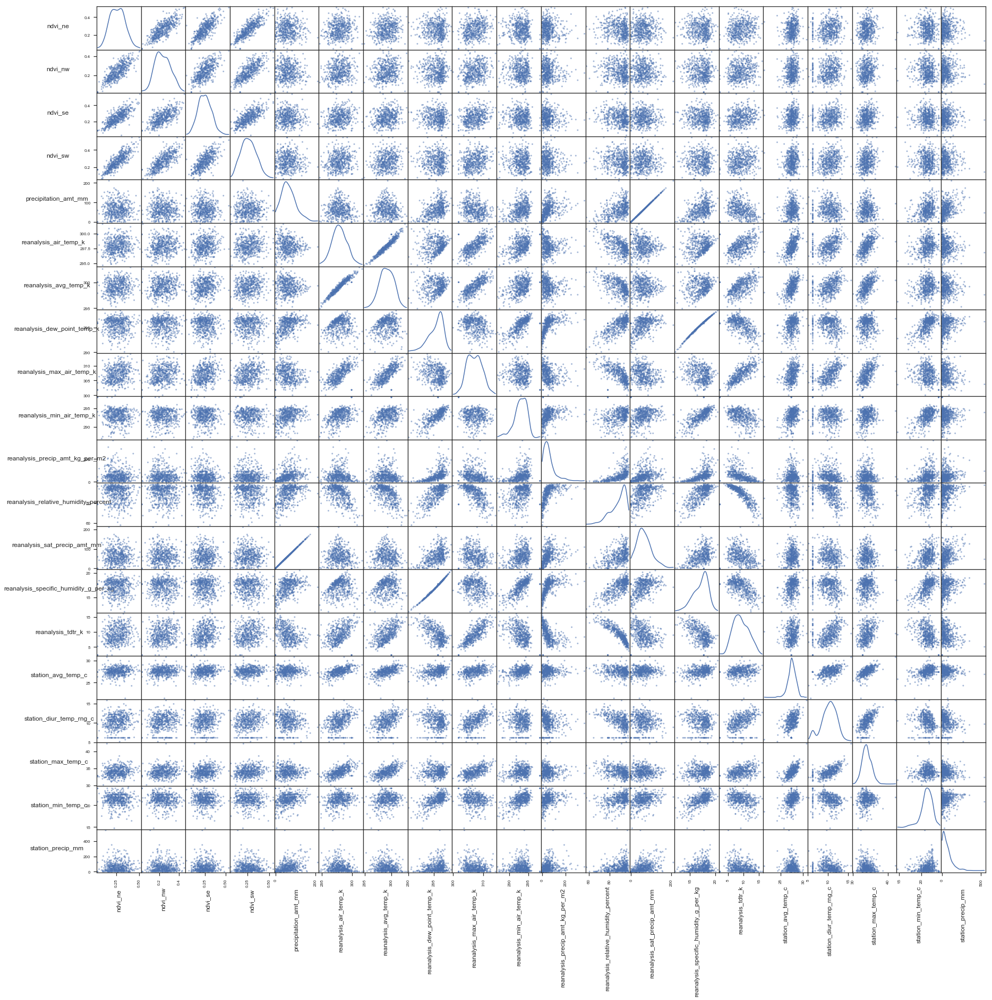

In [21]:
correlation_matrix(iq_X)

__There are definitely a number of features that are highly correlated and so we need to remove those for Linear Regression, let's take a look at the correlation matrix for City iq's data__

In [22]:
# Correlation matrix for City iq's data
iq_X.corr()

,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
ndvi_ne,1.000000,0.774034,0.774317,0.839890,0.014218,0.127790,0.158418,-0.037162,0.239496,-0.046257,-0.066471,-0.116273,0.014218,-0.038419,0.201657,0.109382,0.130617,0.153835,-0.032599,0.020981
ndvi_nw,0.774034,1.000000,0.654885,0.763458,-0.033660,0.129202,0.160483,-0.039842,0.229888,-0.037980,-0.060720,-0.116696,-0.033660,-0.037639,0.200341,0.121743,0.169618,0.168421,-0.108186,-0.009004
ndvi_se,0.774317,0.654885,1.000000,0.716587,-0.023394,0.177077,0.201097,-0.067431,0.278891,-0.055555,-0.109648,-0.176609,-0.023394,-0.066830,0.245867,0.113640,0.150521,0.172615,-0.072521,0.014644
ndvi_sw,0.839890,0.763458,0.716587,1.000000,-0.002726,0.146693,0.170130,-0.034068,0.243211,-0.026474,-0.053889,-0.127395,-0.002726,-0.031982,0.191847,0.110828,0.138694,0.182665,-0.068972,0.004591
precipitation_amt_mm,0.014218,-0.033660,-0.023394,-0.002726,1.000000,-0.071019,-0.062916,0.461964,-0.191111,0.268256,0.347904,0.441872,1.000000,0.456326,-0.325485,0.104711,-0.064426,0.011423,0.268507,0.379101
reanalysis_air_temp_k,0.127790,0.129202,0.177077,0.146693,-0.071019,1.000000,0.969564,0.152962,0.701653,0.433898,-0.096471,-0.555667,-0.071019,0.181193,0.494696,0.575891,0.396199,0.615369,0.261562,-0.145418
reanalysis_avg_temp_k,0.158418,0.160483,0.201097,0.170130,-0.062916,0.969564,1.000000,0.143436,0.756814,0.399067,-0.112285,-0.542291,-0.062916,0.167883,0.569072,0.551703,0.420398,0.606750,0.215982,-0.142035
reanalysis_dew_point_temp_k,-0.037162,-0.039842,-0.067431,-0.034068,0.461964,0.152962,0.143436,1.000000,-0.253297,0.734408,0.567774,0.733533,0.461964,0.997687,-0.596465,0.313601,-0.144900,0.086939,0.611714,0.184254
reanalysis_max_air_temp_k,0.239496,0.229888,0.278891,0.243211,-0.191111,0.701653,0.756814,-0.253297,1.000000,-0.093083,-0.236611,-0.685484,-0.191111,-0.238309,0.807493,0.359023,0.511604,0.587153,-0.129463,-0.175966
reanalysis_min_air_temp_k,-0.046257,-0.037980,-0.055555,-0.026474,0.268256,0.433898,0.399067,0.734408,-0.093083,1.000000,0.362474,0.316890,0.268256,0.741351,-0.438653,0.372890,-0.042654,0.183093,0.608160,0.066370


In [23]:
# Let's use statsmodel's api instead for linear regression
# as it'll provide us a better summary of the fit
iq_ols = sm.OLS(endog=iq_y_train, exog=iq_X_train).fit()

iq_y_pred = iq_pwr.inverse_transform(iq_ols.predict(iq_X_test)[:, None])
iq_ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     3.462
Date:                Fri, 12 Apr 2019   Prob (F-statistic):           2.25e-06
Time:                        13:18:56   Log-Likelihood:                -461.29
No. Observations:                 348   AIC:                             960.6
Df Residuals:                     329   BIC:                             1034.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
ndvi_ne                                   0.4359      1.321      0.330      0.742      -2.163       3.035
ndvi_nw                                   0.2015      1.119      0.180      0.857      -2.000       2.403
ndvi_se                                  -0.7865      1.080     -0.728      0.467      -2.911       1.338
ndvi_sw                                  -0.1954      1.153     -0.169      0.866      -2.463       2.073
precipitation_amt_mm                     -0.0011      0.001     -1.312      0.190      -0.003       0.001
reanalysis_air_temp_k                     0.5016      0.496      1.011      0.313      -0.475       1.478
reanalysis_avg_temp_k                    -0.2188      0.250     -0.877      0.381      -0.710       0.272
reanalysis_dew_point_temp_k              -0.3052      0.523     -0.583      0.560      -1.334       0.724
reanalysis_max_air_temp_k                -0.0397      0.050     -0.797      0.426      -0.138       0.058
reanalysis_min_air_temp_k                 0.0196      0.070      0.281      0.779      -0.118       0.157
reanalysis_precip_amt_kg_per_m2          -0.0019      0.001     -1.362      0.174      -0.005       0.001
reanalysis_relative_humidity_percent      0.0521      0.108      0.484      0.629      -0.160       0.264
reanalysis_sat_precip_amt_mm             -0.0011      0.001     -1.312      0.190      -0.003       0.001
reanalysis_specific_humidity_g_per_kg     0.3692      0.085      4.338      0.000       0.202       0.537
reanalysis_tdtr_k                         0.0731      0.078      0.937      0.350      -0.080       0.227
station_avg_temp_c                        0.0021      0.087      0.024      0.981      -0.170       0.174
station_diur_temp_rng_c                  -0.0554      0.037     -1.483      0.139      -0.129       0.018
station_max_temp_c                        0.0387      0.062      0.623      0.534      -0.083       0.161
station_min_temp_c                        0.0255      0.062      0.410      0.682      -0.097       0.148
station_precip_mm                         0.0010      0.001      1.201      0.231      -0.001       0.003
==============================================================================
Omnibus:                        5.702   Durbin-Watson:                   2.083
Prob(Omnibus):                  0.058   Jarque-Bera (JB):                3.591
Skew:                           0.000   Prob(JB):                        0.166
Kurtosis:                       2.502   Cond. No.                     9.99e+16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.64e-26. This might indicate that th

__From this, we can definitely conclude that there is a strong multicollinearity problem as an almost zero eigen value shows minimal variation in the data orthogonal with other eigen vectors. Hence, we will definitely need to remove some of those features later on in the Feature Engineering section.__

#### Conclusion:
- __Seems like these feature groups have very high correlation > 0.7:__
- `ndvi_sw` and `ndvi_se`
- `reanalysis_air_temp_k` and `reanalysis_avg_temp_k` and `reanalysis_dew_point_temp_k` and `reanalysis_min_air_temp_k` and `reanalysis_specific_humidity_g_per_kg` and `station_avg_temp_c` and `	station_max_temp_c` and `station_min_temp_c`

---
<a id="homo"></a>

## 4. Homoscedasticity (Errors have similar variance and no trend with predicted values)

In [24]:
# Helper function to plot the residuals 
# of the Ordinary Least Squares Regression
# against each feature
def plot_residuals_feat(residuals, X):
    # Plot residuals
    rcParams['figure.figsize'] = 10, 40
    fig, ax = plt.subplots(len(X.columns) // 2,2)

    for idx, name in enumerate(X.columns):
        if idx < len(X.columns) // 2:
            ax[idx, 0].scatter(X[name], residuals)
            ax[idx, 0].grid(True)
            ax[idx, 0].set_title("Residuals against {}".format(name), color='k')
            ax[idx, 0].set_ylabel("Residuals")
            ax[idx, 0].set_xlabel("{}".format(name))
        else:
            ax[idx - (len(X.columns) // 2), 1].scatter(X[name], residuals)
            ax[idx - (len(X.columns) // 2), 1].grid(True)
            ax[idx - (len(X.columns) // 2), 1].set_title("Residuals against {}".format(name), color='k')
            ax[idx - (len(X.columns) // 2), 1].set_ylabel("Residuals")
            ax[idx - (len(X.columns) // 2), 1].set_xlabel("{}".format(name))

    plt.tight_layout()
    plt.show();
    
# Helper function to plot the residuals
# of the Ordinary Least Squares Regression
# against the label
def plot_residuals_label(residuals, y_pred):
    # Plot residuals
    rcParams['figure.figsize'] = 10, 5
    fig, ax = plt.subplots(1,2)

    ax[0].scatter(y_pred, residuals)
    ax[0].grid(True)
    ax[0].set_title("Residuals against {}".format('OLS_y_pred'), color='k')
    ax[0].set_ylabel("Residuals")
    ax[0].set_xlabel("{}".format('OLS_y_pred'))

    ax[1].hist(residuals)
    ax[1].grid(True)
    ax[1].set_title("Histogram of Residuals", color='k')
    ax[1].set_ylabel("Frequency of Residuals")
    ax[1].set_xlabel("{}".format('OLS_y_pred'))

    plt.tight_layout()
    plt.show();

- __City sj: Create Standardized residual plot against each one of the predictor variables__

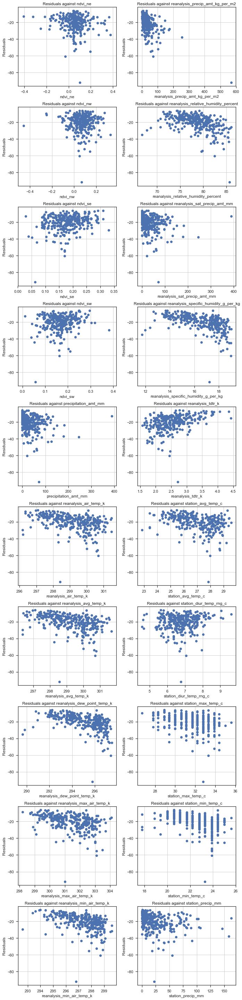

In [25]:
# Get the residuals for City sj's OLS prediction
sj_residuals = sj_y_test - sj_y_pred.flatten()

plot_residuals_feat(sj_residuals, sj_X_test)

- __Let's also see the Residuals against predicted values plot and its Histogram__

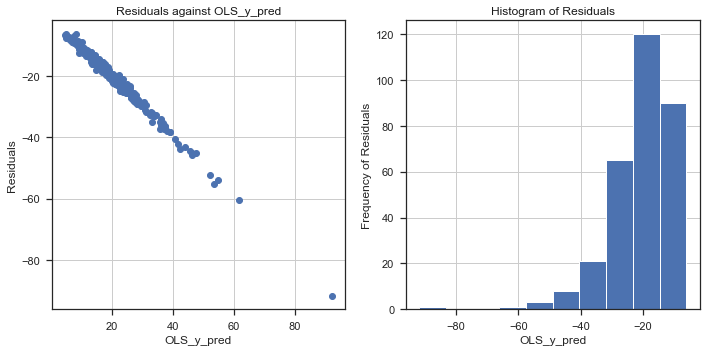

In [26]:
plot_residuals_label(sj_residuals, sj_y_pred)

__We'll now perform the Breusch Pagan test to check for heteroskedasticity__
- __Null Hypothesis: All observations have the same error variance, hence homoskedastic.__

In [27]:
# Can't find diagnostic
# _, sj_residuals_bp_pvalue, _, _ = statsmodels.stats.diagnostic.het_breuschpagan(sj_residuals)

- __City iq: Create Standardized residual plot against each one of the predictor variables__

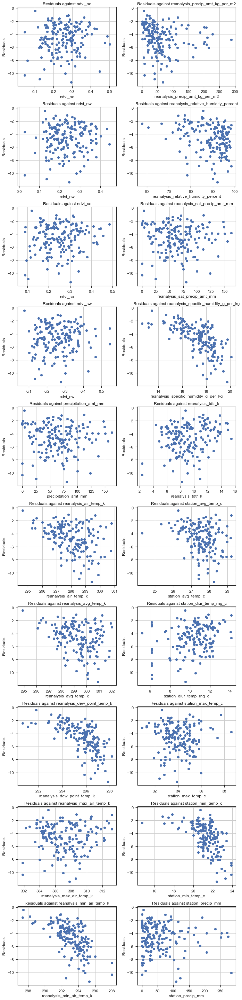

In [28]:
# Get the residuals for City iq's OLS prediction
iq_residuals = iq_y_test - iq_y_pred.flatten()

plot_residuals_feat(iq_residuals, iq_X_test)

- __Let's also see the Residuals against predicted values plot and its Histogram__

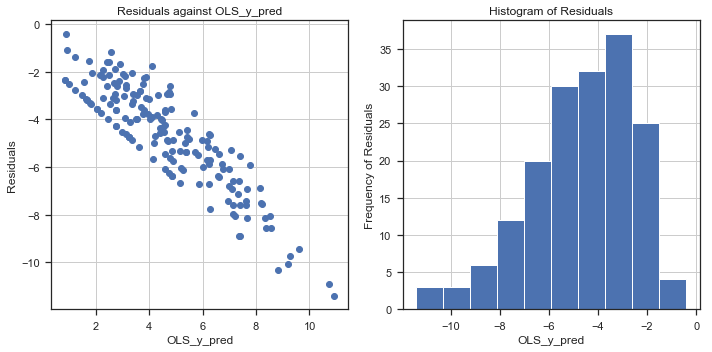

In [29]:
plot_residuals_label(iq_residuals, iq_y_pred)

__We'll now perform the Breusch Pagan test to check for heteroskedasticity__
- __Null Hypothesis: All observations have the same error variance, hence homoskedastic.__

In [30]:
# Can't find diagnostic
# _, iq_residuals_bp_pvalue, _, _ = statsmodels.stats.diagnostic.het_breuschpagan(iq_residuals)

#### Conclusion:
- 

---
<a id="normerr"></a>

## 5. Normality of errors

In [31]:
# Helper function to plot the distribution
# of residuals overlayed on the normal distribution
# to gauge if the errors are normally distributed
def plot_residuals_dist(residuals):
    rcParams['figure.figsize'] = 4, 4

    ax = sns.distplot(residuals)
    sns.kdeplot(np.random.normal(size=len(residuals)))
    ax.grid(True)
    ax.set_title("Distribution of {}".format('OLS Residuals'), color='k')

    plt.tight_layout()
    plt.show();

- __City sj Error distribution plot:__

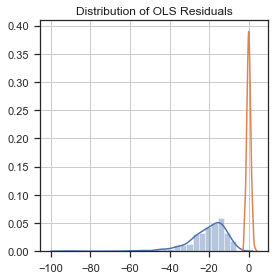

In [32]:
plot_residuals_dist(sj_residuals)

__Let's use the Jarque-Bera test (unreliable though, since we have less than 2000 data samples) to check whether the residuals are normally distributed__
- __Null Hypothesis: Joint hypothesis of the skewness being zero and the excess kurtosis being zero (Normally Distributed).__

In [33]:
_, sj_residuals_pvalue = stats.jarque_bera(sj_residuals)
print(sj_residuals_pvalue)

_, norm_residuals_pvalue = stats.jarque_bera(np.random.normal(size=len(sj_residuals)))
print(norm_residuals_pvalue)

0.0
0.8303925956946897


__Seems like our residuals are obviously not normally distributed, we'll have to feature engineer some new features in order to continue using linear regression__

- __City iq Error distribution plot:__

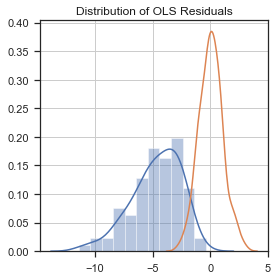

In [34]:
plot_residuals_dist(iq_residuals)

__Let's use the Jarque-Bera test (unreliable though, since we have less than 2000 data samples) to check whether the residuals are normally distributed__
- __Null Hypothesis: Joint hypothesis of the skewness being zero and the excess kurtosis being zero (Normally Distributed).__

In [35]:
_, iq_residuals_pvalue = stats.jarque_bera(iq_residuals)
print(iq_residuals_pvalue)

_, norm_residuals_pvalue = stats.jarque_bera(np.random.normal(size=len(iq_residuals)))
print(norm_residuals_pvalue)

0.001110548015989865
0.7732898927241776


__Seems like our residuals are obviously not normally distributed, we'll have to feature engineer some new features in order to continue using linear regression__

---
<a id="autocorr"></a>

## 6. Autocorrelation